In [1]:
import pandas as pd
import datetime
from dateutil import parser
import matplotlib.pyplot as plt

In [2]:
plt.rcParams['figure.figsize'] = (16, 9/3)
plt.rcParams['figure.dpi'] = 300
plt.style.use('bmh')

# Air quality 1h

In [3]:
url = 'http://ogd.zueriluft.ch/api/v1/h1.csv'
air_h1 = pd.read_csv(url, encoding='iso-8859-1', sep=';')
air_h1.head(7)

,Datum,Zürich Stampfenbachstrasse,Zürich Stampfenbachstrasse.1,Zürich Stampfenbachstrasse.2,Zürich Stampfenbachstrasse.3,Zürich Stampfenbachstrasse.4,Zürich Stampfenbachstrasse.5,Zürich Stampfenbachstrasse.6,Zürich Schimmelstrasse,Zürich Schimmelstrasse.1,Zürich Schimmelstrasse.2,Zürich Rosengartenstrasse,Zürich Rosengartenstrasse.1,Zürich Rosengartenstrasse.2,Zürich Heubeeribüel,Zürich Heubeeribüel.1
0,NaN,Zch_Stampfenbachstrasse,Zch_Stampfenbachstrasse,Zch_Stampfenbachstrasse,Zch_Stampfenbachstrasse,Zch_Stampfenbachstrasse,Zch_Stampfenbachstrasse,Zch_Stampfenbachstrasse,Zch_Schimmelstrasse,Zch_Schimmelstrasse,Zch_Schimmelstrasse,Zch_Rosengartenstrasse,Zch_Rosengartenstrasse,Zch_Rosengartenstrasse,Zch_Heubeeribüel,Zch_Heubeeribüel
1,NaN,Ozon,Stickstoffdioxid,Feinstaub PM10,Lufttemperatur,Luftdruck,Windrichtung,Windgeschwindigkeit vektoriell,Ozon,Stickstoffdioxid,Feinstaub PM10,Ozon,Stickstoffdioxid,Feinstaub PM10,Ozon,Stickstoffdioxid
2,NaN,O3,NO2,PM10,T,p,WD,WVv,O3,NO2,PM10,O3,NO2,PM10,O3,NO2
3,NaN,h1,h1,h1,h1,h1,h1,h1,h1,h1,h1,h1,h1,h1,h1,h1
4,NaN,µg/m3,µg/m3,µg/m3,°C,hPa,°,m/s,µg/m3,µg/m3,µg/m3,µg/m3,µg/m3,µg/m3,µg/m3,µg/m3
5,23.03.2021 13:00,72.39,14.93,15.03,9.63,973.32,20.58,2.23,67.65,26.16,14.98,67.35,26.08,15.25,82.15,4.28
6,23.03.2021 14:00,76.74,12.98,12.67,10.03,972.81,15.58,1.11,71.13,27.19,16.33,NaN,NaN,14.41,84.99,4.28


In [4]:
air_h1.index = air_h1.Datum
air_h1 = air_h1.drop('Datum',axis=1)

In [5]:
sensor_types = list(set(air_h1.iloc[1].values))
sensor_types

[' Windgeschwindigkeit vektoriell',
 ' Luftdruck',
 ' Ozon',
 ' Stickstoffdioxid',
 ' Feinstaub PM10',
 ' Windrichtung',
 ' Lufttemperatur']

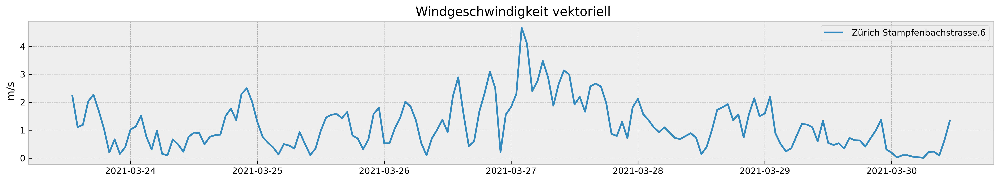

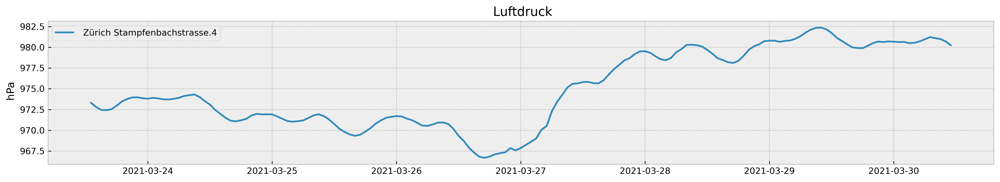

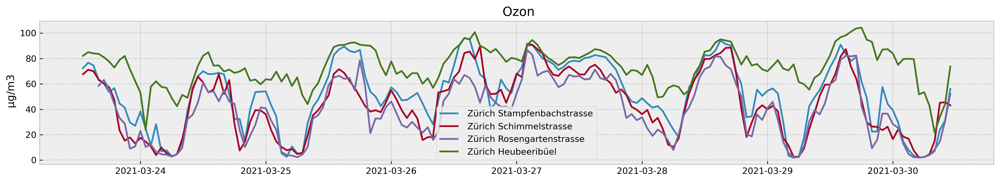

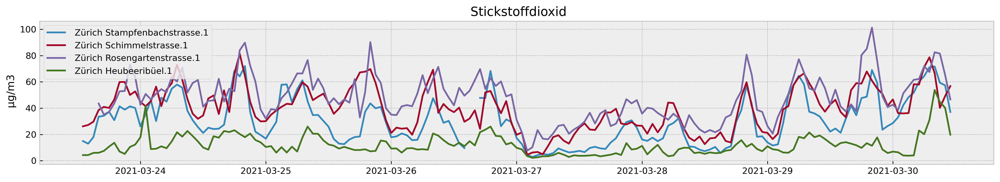

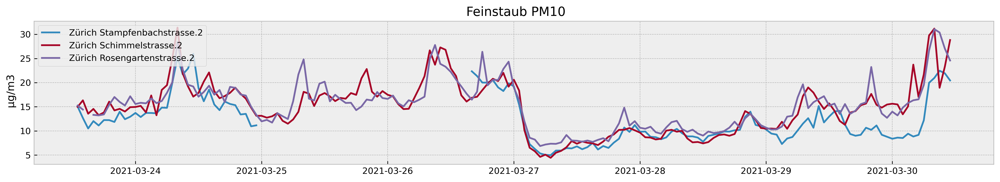

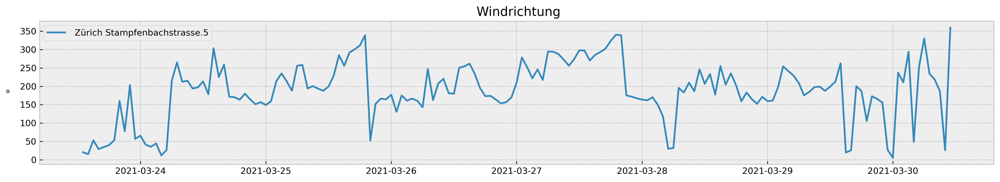

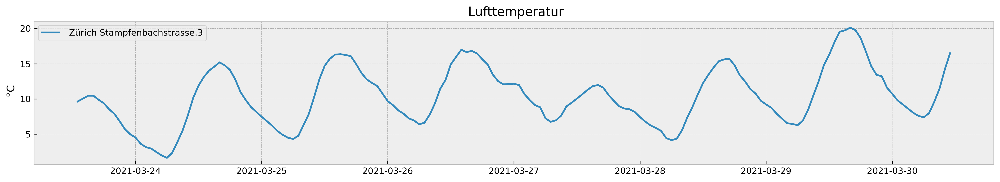

In [6]:
for sensor_type in sensor_types:
    for column in air_h1.columns:
        if air_h1[column][1] == sensor_type:
            values, timestamps = [], []
            for i in range(5,air_h1.shape[0]):
                value = float(air_h1[column][i])
                timestamp = datetime.datetime.strptime(air_h1.index[i], "%d.%m.%Y %H:%M")
                values.append(value)
                timestamps.append(timestamp)
            plt.plot(timestamps, values, label=column)
            unit = air_h1[column][4]
    plt.title(sensor_type)
    plt.ylabel(unit)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Air quality 2021

Change in URL: ugz in link
 - https://data.stadt-zuerich.ch/dataset/luftqualitaet-stunden-aktuelle-messungen
 - https://data.stadt-zuerich.ch/dataset/ugz_luftschadstoffmessung_stundenwerte

In [7]:
url = 'https://data.stadt-zuerich.ch/dataset/ugz_luftschadstoffmessung_tageswerte/download/ugz_ogd_air_d1_2021.csv'
air_y2021 = pd.read_csv(url)
air_y2021.head(3)

,Datum,Standort,Parameter,Intervall,Einheit,Wert,Status
0,2021-01-01T00:00+0100,Zch_Stampfenbachstrasse,SO2,d1,µg/m3,1.59,provisorisch
1,2021-01-01T00:00+0100,Zch_Stampfenbachstrasse,CO,d1,mg/m3,0.23,provisorisch
2,2021-01-01T00:00+0100,Zch_Stampfenbachstrasse,NOx,d1,ppb,14.23,provisorisch


In [8]:
air_y2021.index = air_y2021.Datum
air_y2021 = air_y2021.drop('Datum',axis=1)

In [9]:
sensor_types = air_y2021.Parameter.unique()
sensor_types

array(['SO2', 'CO', 'NOx', 'NO', 'NO2', 'O3', 'PM10', 'PM2.5',
       'O3_max_h1', 'O3_nb_h1>120', 'PN'], dtype=object)

In [10]:
stations = air_y2021.Standort.unique()
stations

array(['Zch_Stampfenbachstrasse', 'Zch_Schimmelstrasse',
       'Zch_Rosengartenstrasse', 'Zch_Heubeeribüel'], dtype=object)

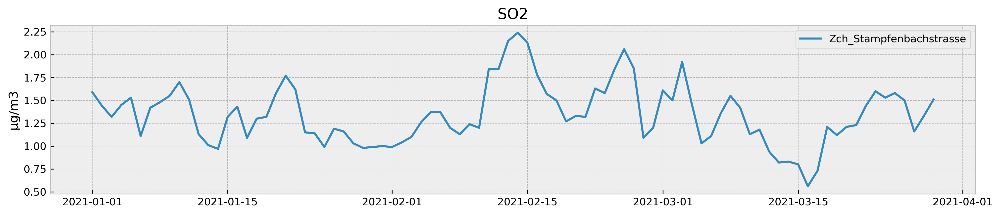

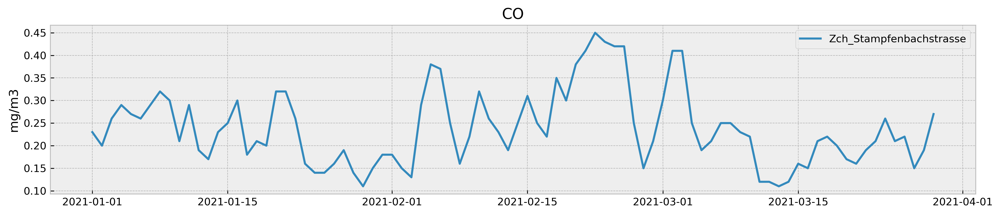

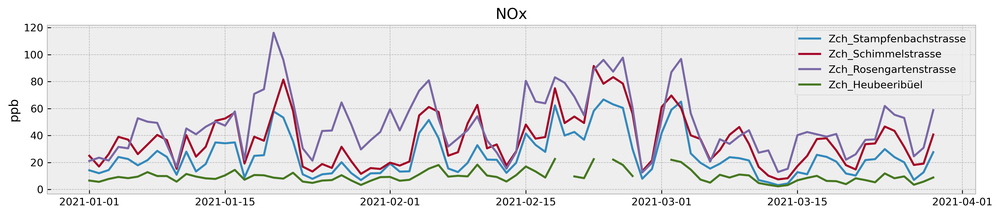

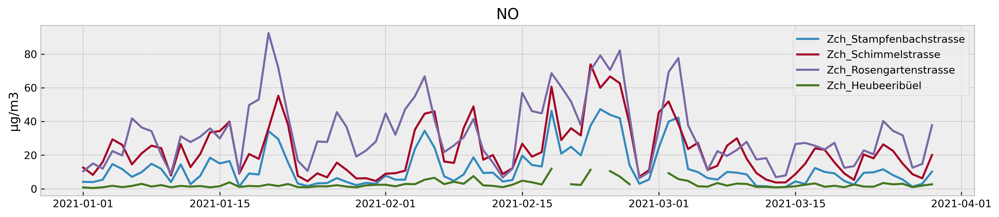

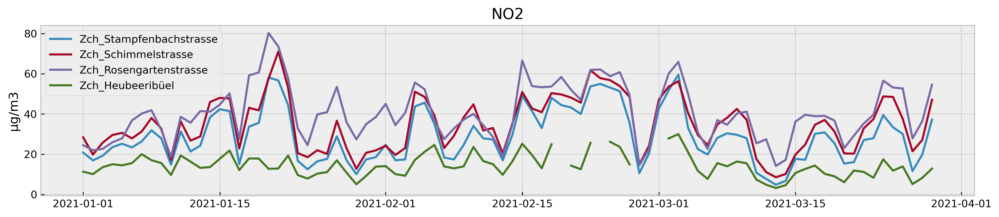

...

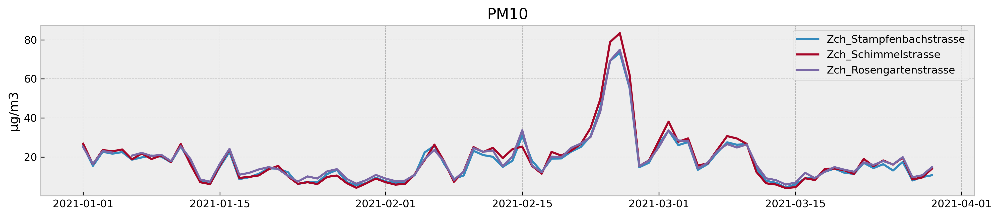

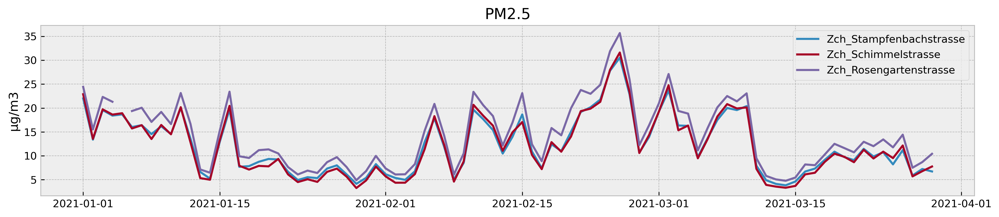

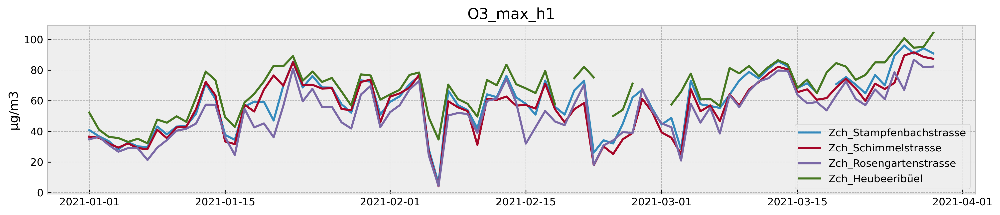

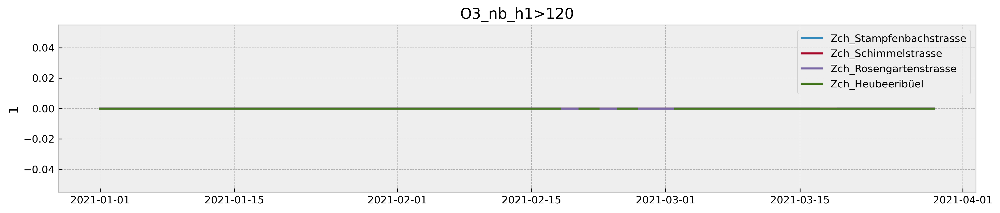

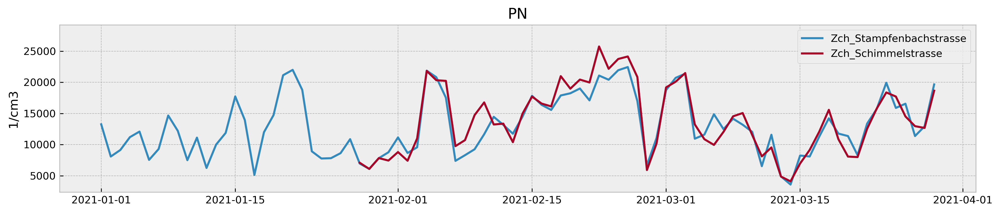

In [11]:
for sensor_type in sensor_types:
    for station in stations:
        type_selection = air_y2021[air_y2021.Parameter == sensor_type]
        events = type_selection[type_selection.Standort == station]
        if events.shape[0]>2:
            values = events.Wert.values
            timestamps = []
            for timestamp in events.index:
                timestamp_dt = parser.isoparse(timestamp)
                timestamps.append(timestamp_dt)
            plt.plot(timestamps, values, label = station)
            plt.ylabel(events.Einheit.values[0])
    plt.title(sensor_type)
    plt.legend()
    plt.show()

# Velo & Pedestrian 2021

In [12]:
url = 'https://data.stadt-zuerich.ch/dataset/ted_taz_verkehrszaehlungen_werte_fussgaenger_velo/download/2021_verkehrszaehlungen_werte_fussgaenger_velo.csv'
fz_y2021 = pd.read_csv(url)
fz_y2021.head(3)

,FK_ZAEHLER,FK_STANDORT,DATUM,VELO_IN,VELO_OUT,FUSS_IN,FUSS_OUT,OST,NORD
0,U15G3063865,1357,2021-01-01T00:00,NaN,NaN,20.0,0.0,2682973,1246329
1,ECO09113499,3927,2021-01-01T00:00,0.0,3.0,NaN,NaN,2682873,1245891
2,U15G3063867,1358,2021-01-01T00:00,NaN,NaN,4.0,1.0,2683557,1251702


In [14]:
fz_y2021.index = fz_y2021.DATUM
fz_y2021 = fz_y2021.drop('DATUM',axis=1)

In [15]:
sensor_types = ['VELO_IN', 'VELO_OUT', 'FUSS_IN', 'FUSS_OUT',]

In [16]:
zählers = fz_y2021.FK_ZAEHLER.unique()
zählers

array(['U15G3063865', 'ECO09113499', 'U15G3063867', 'U15G3063869',
       'YSH18065716', 'Y2H19111476', 'ECO09113506', 'U15G6121229',
       'Y2G13124879', 'U15G3063873', 'Y2H19111477', 'Y2H20083483',
       'ECO09113507', 'Y2H19070585', 'YPH15108550', 'Y2H20063173',
       'Y2H18106792', 'ECO10053914', 'Y2H16039396', 'Y2H16069942',
       'U15G3063864', 'ECO09113503', 'ECO09113500', 'U15G3063870',
       'Y2H19090841', 'U15G3063872', 'U15G3104442', 'Y2H19101255',
       'U15G3104443', 'U15G3104444', 'U15G3063866', 'U15G3104447',
       'Y2H20011946', 'Y2G13124877', 'Y2H19070283', 'Y2H19101198',
       'Y2H16069943', 'Y2H20114444'], dtype=object)

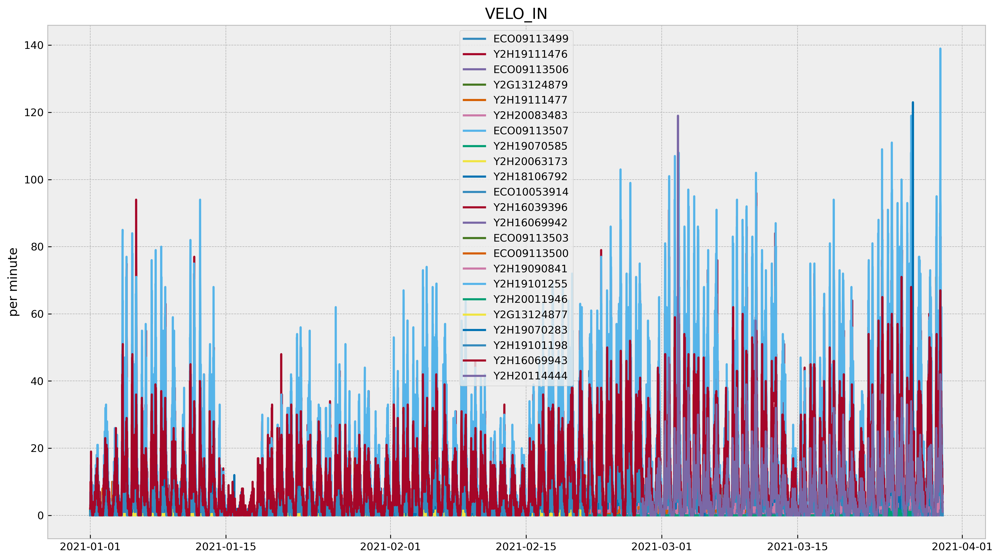

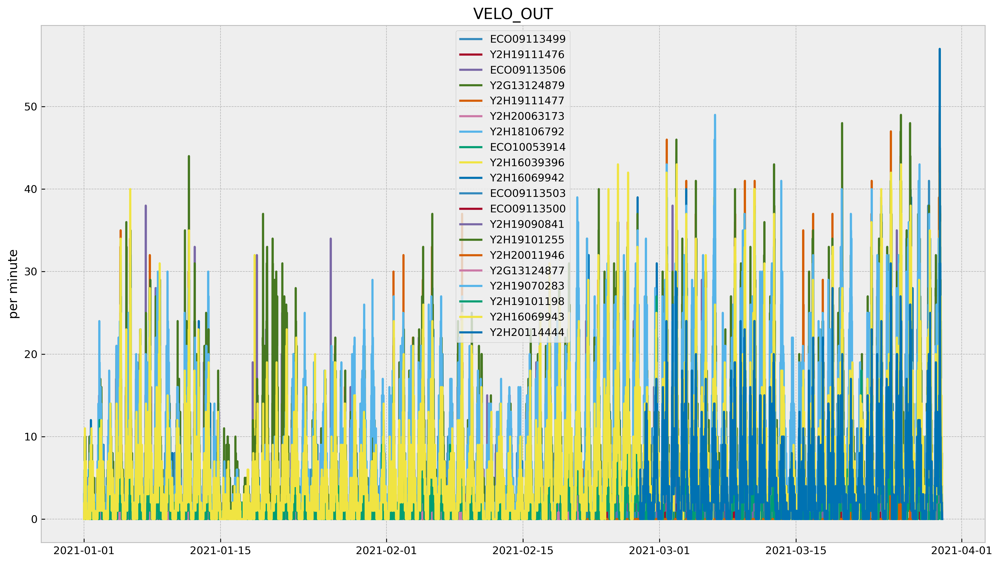

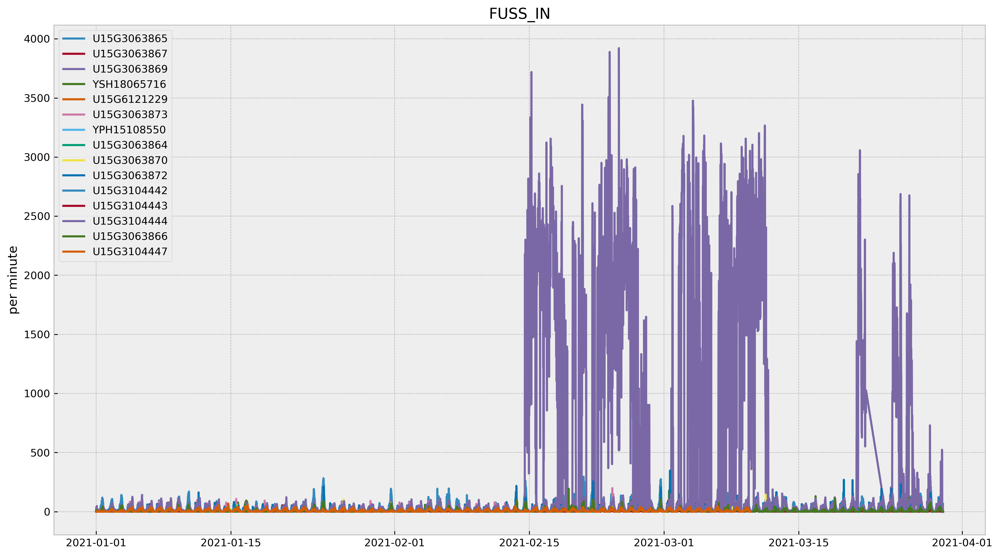

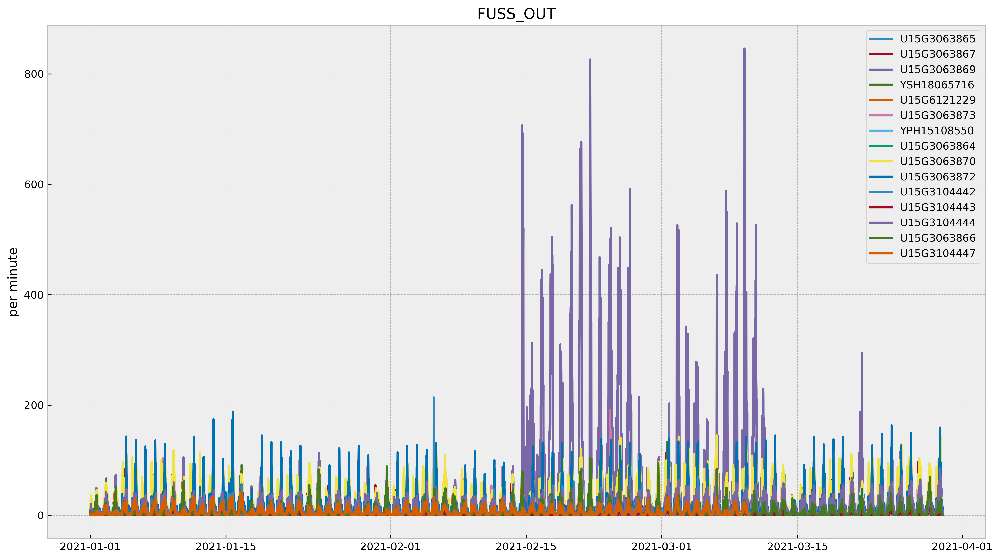

In [18]:
for sensor_type in sensor_types:
    plt.figure(figsize=(16,9))
    for zähler in zählers:
        events = fz_y2021[fz_y2021.FK_ZAEHLER == zähler]
        values = events[sensor_type].values
        if values.sum()>1:
            timestamps = []
            for timestamp in events.index:
                timestamp_dt = parser.isoparse(timestamp)
                timestamps.append(timestamp_dt)
            plt.plot(timestamps, values, label = zähler)
    plt.ylabel('per minute')
    plt.title(sensor_type)
    plt.legend()
    plt.show()